# 0 Introduction : 

Cette page permet de visualier une analyse sur les logements à Londres. Plusieurs tableaux de données ont été chargés : 
- le premier qui nous a permis de faire du clustering au niveau des quartiers   https://data.london.gov.uk/download/average-house-prices/f01b1cc7-6daa-4256-bd6c-94d8c83ee000/land-registry-house-prices-borough.xls, ce dataset contient le prix médian, moyen et le premier quartile des maisons pour chaque quartier, en décembre, mars et juin de chaque année depuis 1995 jusqu'à 2017. Il contient aussi le nombre de ventes par quartier à la même fréquence et sur les mêmes années. 
- le second dataset chargé nous a permis de faire de la régression et de la classification, (je retrouve pas le lien), c'est un recencement de 1000 logements, qui contient les variables suivantes : Adresse, quartier, chambres, salle de bain, surface, age du batiment, présence d'un garage, nombre d'étages, type d'énergie, balcon, style intérieur, vue, matériaux, statut du batiment, prix. PQ MILLE ?? QUAND ?? Idéalement il aurait fallu plus de logements afin d'obtenir des résultats plus sûrs. Cependant les méthodes que nous avons mises en place permettent d'estimer le prix d'une maison pour des conditions?? données. 
- un autre dataset concernant le prix moyen des maisons par quartier des années 1995 à 2017 
- london.csv

# 1.Statistiques descriptives
## 1.1 Prix des maisons

Regardons dans un premier temps l'évolution du prix moyen des logements à Londres d'année en année depuis 1995. 

In [2]:
import dash
from dash import dcc, html, Input, Output
import pandas as pd
import plotly.express as px
import folium
from folium import Map, Marker, Popup, IFrame
import dash_html_components as html
import dash_core_components as dcc
import json
import dash_table
from sklearn.cluster import KMeans  # only import once
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import accuracy_score
from xgboost import XGBClassifier
import lightgbm as lgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

<ipython-input-2-084970b2cadc>:7: UserWarning: 
The dash_html_components package is deprecated. Please replace
`import dash_html_components as html` with `from dash import html`
  import dash_html_components as html
<ipython-input-2-084970b2cadc>:8: UserWarning: 
The dash_core_components package is deprecated. Please replace
`import dash_core_components as dcc` with `from dash import dcc`
  import dash_core_components as dcc
<ipython-input-2-084970b2cadc>:10: UserWarning: 
The dash_table package is deprecated. Please replace
`import dash_table` with `from dash import dash_table`

Also, if you're using any of the table format helpers (e.g. Group), replace 
`from dash_table.Format import Group` with 
`from dash.dash_table.Format import Group`
  import dash_table
/opt/anaconda3/lib/python3.8/site-packages/dask/dataframe/utils.py:369: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  _n

<ipython-input-45-e784d275f104>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-45-e784d275f104>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



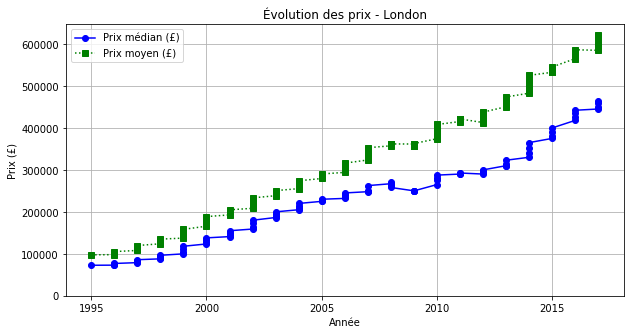

In [45]:
medianes = pd.read_csv('land-registry-house-prices-borough.csv')
medianes["Year"] = medianes["Year"].astype(str).str.extract(r'(\d{4})').astype(int)
# Enlever les virgules et convertir en type numérique
medianes["Value"] = medianes["Value"].str.replace(",", "").astype(float)
# Sélectionner un borough spécifique (ex : "Westminster")
borough = "London"
df_borough = medianes[medianes["Area"] == borough]

# Séparer les types de mesures
df_median = df_borough[df_borough["Measure"] == "Median"]
df_mean = df_borough[df_borough["Measure"] == "Mean"]

# Assurer que les valeurs sont en type float (au cas où il y a des virgules)
df_median["Value"] = df_median["Value"].replace({',': ''}, regex=True).astype(float)
df_mean["Value"] = df_mean["Value"].replace({',': ''}, regex=True).astype(float)

# Création du graphique
fig, ax = plt.subplots(figsize=(10, 5))

# Tracer les prix médian et moyen
ax.plot(df_median["Year"], df_median["Value"], color='blue', marker='o', label="Prix médian (£)")
ax.plot(df_mean["Year"], df_mean["Value"], color='green', marker='s', linestyle="dotted", label="Prix moyen (£)")

# Mettre des ticks d'années tous les 5 ans
ax.set_xticks(np.arange(df_borough["Year"].min(), df_borough["Year"].max() + 1, 5))

# Limiter les ticks des prix tous les 50 000 £
prix_max = df_borough[df_borough["Measure"].isin(["Median", "Mean"])]["Value"].max()
ax.set_yticks(np.arange(0, prix_max + 50000, 100000))

# Ajouter les labels
ax.set_xlabel("Année")
ax.set_ylabel("Prix (£)")
ax.set_title(f"Évolution des prix - {borough}")
ax.legend()

# Affichage
plt.grid()
plt.savefig("evolution_prix_maisons.png")
plt.show()

In [46]:
df_mean

,Code,Area,Year,Measure,Value
4044,E12000007,London,1995,Mean,97628.0
4089,E12000007,London,1996,Mean,97991.0
4134,E12000007,London,1996,Mean,99642.0
4179,E12000007,London,1996,Mean,102800.0
4224,E12000007,London,1996,Mean,105337.0
...,...,...,...,...,...
7824,E12000007,London,2016,Mean,586093.0
7869,E12000007,London,2017,Mean,584697.0
7914,E12000007,London,2017,Mean,600043.0
7959,E12000007,London,2017,Mean,613104.0


Ce premier graphique ne montre rien de surprenant. Comme dans la majorité des grandes villes, le prix des logements augmente d'année en année. On peut aussi voir que le prix moyen augmente plus rapidement que le prix médian, ce qui signifie que d'année en année il y a plus de maisons au dessus de la médiane qu'en dessous (à mieux formuler). 

In [5]:
df_borough["Area"].unique()

array(['London'], dtype=object)

Voici tous les quartiers de Londres (le mettre au début ??)

In [167]:
# Créer un widget de sélection pour le quartier
dropdown = widgets.Dropdown(
    options=medianes["Area"].unique(),
    description='Quartier:',
    disabled=False
)

# Fonction pour mettre à jour le graphe en fonction du quartier sélectionné
def update_graph(quartier):
    # Filtrer les données pour le quartier sélectionné
    df_quartier = medianes[medianes["Area"] == quartier]
    
    # Créer le graphique interactif
    fig = px.line(df_quartier, x="Year", y="Value", color="Measure",
                  title=f"Évolution des prix à {quartier}",
                  labels={"Value": "Prix (£)", "Year": "Année"})
    
    fig.show()

# Afficher le widget et initialiser le graphe
widgets.interactive(update_graph, quartier=dropdown)

interactive(children=(Dropdown(description='Quartier:', options=('City of London', 'Barking and Dagenham', 'Ba…

Ce graphique permet de visualiser l'évolution du prix moyen et médian d'un quartier spécifique choisi. De manière générale comme sur le prix moyen et médian des logements de Londres, la moyenne et la médiane augmentent, avec la moyenne qui augmente plus vite. 

In [194]:
#est ce qu'on met ????
# Afficher les valeurs uniques dans la colonne "Area"
aires_uniques = medianes["Area"].unique()
print(aires_uniques)

['City of London' 'Barking and Dagenham' 'Barnet' 'Bexley' 'Brent'
 'Bromley' 'Camden' 'Croydon' 'Ealing' 'Enfield' 'Greenwich' 'Hackney'
 'Hammersmith and Fulham' 'Haringey' 'Harrow' 'Havering' 'Hillingdon'
 'Hounslow' 'Islington' 'Kensington and Chelsea' 'Kingston upon Thames'
 'Lambeth' 'Lewisham' 'Merton' 'Newham' 'Redbridge' 'Richmond upon Thames'
 'Southwark' 'Sutton' 'Tower Hamlets' 'Waltham Forest' 'Wandsworth'
 'Westminster' 'North East' 'North West' 'Yorkshire And The Humber'
 'East Midlands' 'West Midlands' 'East of England' 'London' 'South East'
 'South West' 'England' 'Wales' 'England And Wales']


Regardons maintenant le tableau de données london.csv. Ce n'est pas celui used pour la rég et la classi mais on peut tester (y'a plus de données, juste y'a pas le nom des quartiers)
### 1.1.2 London.csv

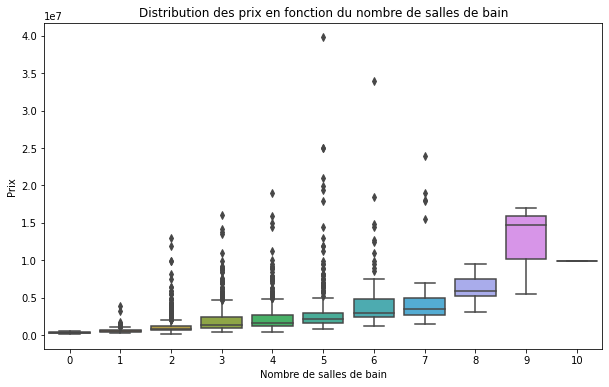

In [195]:
nbr_pieces = pd.read_csv('London.csv')
nbr_pieces = nbr_pieces[nbr_pieces["City/County"] == "London"]
# Créer le boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x=nbr_pieces["No. of Bathrooms"], y=nbr_pieces["Price"])

# Ajouter un titre et des labels
plt.title("Distribution des prix en fonction du nombre de salles de bain")
plt.xlabel("Nombre de salles de bain")
plt.ylabel("Prix")

# Afficher le graphique
plt.show()

On a ici les boxplot des prix des logements en fonction du nombre de maisons, les boxplot sont de plus en plus haut lorsque le nombre de salles de bain augmente (constat attendu). Peut être regarder le prix au mètre carré plutôt 

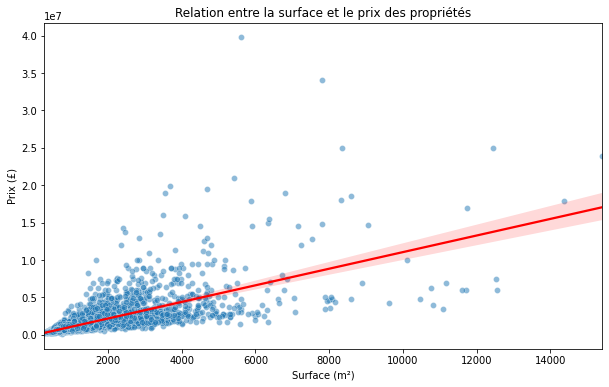

In [82]:
plt.figure(figsize=(10, 6))
sns.scatterplot(x=nbr_pieces["Area in sq ft"], y=nbr_pieces["Price"], alpha=0.5)
sns.regplot(x=nbr_pieces["Area in sq ft"], y=nbr_pieces["Price"], scatter=False, color="red")

plt.title("Relation entre la surface et le prix des propriétés")
plt.xlabel("Surface (m²)")
plt.ylabel("Prix (£)")
plt.show()

La relation ente le prix et la surface ne semble pas être liénaire, ainsi le prix au mètre carré dépendra de différentes variables. (constat à vérifier??)

In [84]:
fig = px.scatter(nbr_pieces, x="Area in sq ft", y="Price",
                 title="Relation entre la surface et le prix",
                 labels={"aire": "Surface (m²)", "prix": "Prix (£)"},
                 opacity=0.5)

fig.show()


In [91]:
from scipy.stats import spearmanr

corr, p_value = spearmanr(nbr_pieces["No. of Bathrooms"], nbr_pieces["Price"])
print(f"Corrélation : {corr}, p-value : {p_value}")

Corrélation : 0.6944392984562998, p-value : 0.0


In [92]:
from scipy.stats import spearmanr

corr, p_value = spearmanr(nbr_pieces["No. of Bedrooms"], nbr_pieces["Price"])
print(f"Corrélation : {corr}, p-value : {p_value}")

Corrélation : 0.6944392984562998, p-value : 0.0


### 1.1.3 london_houses.csv

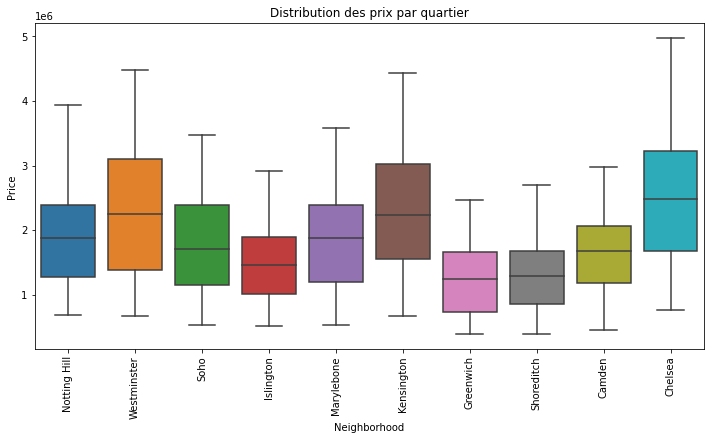

In [197]:
age_batiment = pd.read_csv("london_houses.csv")
import seaborn as sns
import matplotlib.pyplot as plt
age_batiment = age_batiment.rename(columns={'Price (£)': 'Price'})
plt.figure(figsize=(12, 6))
sns.boxplot(x="Neighborhood", y="Price", data=age_batiment)
plt.xticks(rotation=90)
plt.title("Distribution des prix par quartier")
plt.show()

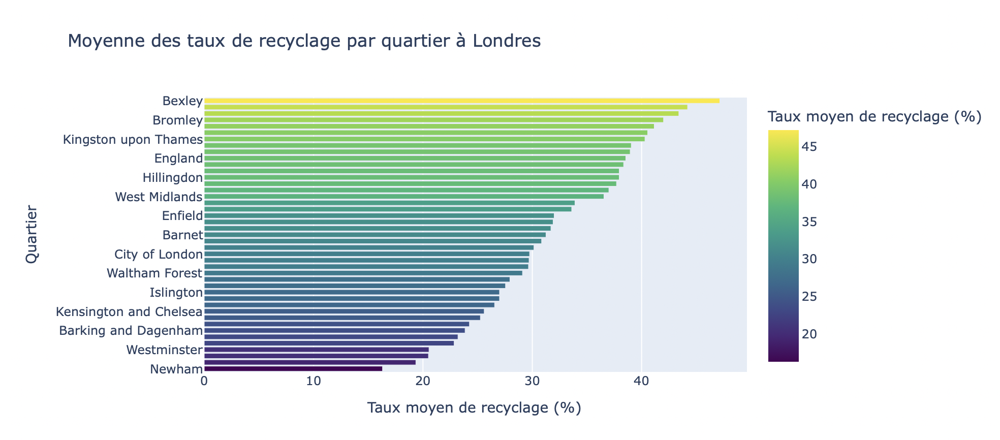Regardons la corrélation entre le quartier le prix en faisant une ANOVA (+ détailler)

In [183]:
import statsmodels.api as sm
from statsmodels.formula.api import ols
# Modèle ANOVA
model = ols('Price ~ Neighborhood', data=age_batiment).fit()
anova_table = sm.stats.anova_lm(model, typ=2)
print(anova_table)

                    sum_sq     df          F        PR(>F)
Neighborhood  1.493069e+14    9.0  26.355041  5.176599e-41
Residual      6.231734e+14  990.0        NaN           NaN


L'ANOVA montre une p-value très faible ( 5.2e-41), ce qui indique une corrélation statistiquement significative entre le quartier (Property_Name) et le prix du logement.
F-statistic = 26.35 : Il y a une certaine variabilité des prix expliquée par le quartier.
p-value < 0.05 : On rejette l'hypothèse nulle d'absence d'effet du quartier sur le prix.
df élevé ??? : Il y a beaucoup de quartiers différents, ce qui peut complexifier l'analyse.

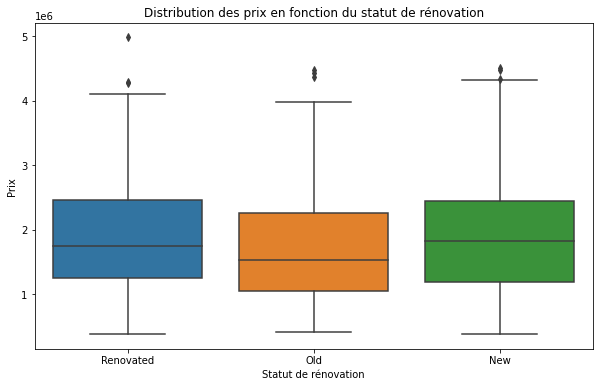

In [95]:
# Créer le boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(x=age_batiment["Building Status"], y=age_batiment["Price (£)"])

# Ajouter un titre et des labels
plt.title("Distribution des prix en fonction du statut de rénovation")
plt.xlabel("Statut de rénovation")
plt.ylabel("Prix")

# Afficher le graphique
plt.show()

## 1.2 Ménages
### 1.2.1 Tenure-households-bourough.csv 

In [2]:
menages=pd.read_csv("tenure-households-borough.csv")

In [3]:
menages

,Code,Name,Year,Tenure,Number_of_households,Number_Confidence_Intervals,Percent_of_households_in_borough,Percent_Confidence_Intervals
0,E09000001,City of London,2018,Own.Outright,-,-,-,-
1,E09000002,Barking and Dagenham,2018,Own.Outright,15800,3400,22,4.7
2,E09000003,Barnet,2018,Own.Outright,45900,7400,31.7,5.1
3,E09000004,Bexley,2018,Own.Outright,36400,5000,35.8,5
4,E09000005,Brent,2018,Own.Outright,22200,4800,21.9,4.7
...,...,...,...,...,...,...,...,...
3115,E12000009,South West,2006,Total,NaN,NaN,100,0
3116,W92000004,Wales,2006,Total,NaN,NaN,100,0
3117,S92000003,Scotland,2006,Total,NaN,NaN,100,0
3118,N92000002,Northern Ireland,2006,Total,NaN,NaN,100,0


In [7]:
print(menages['Year'].unique())

[2018 2017 2016 2015 2014 2013 2012 2011 2010 2009 2008 2007 2006]


In [8]:
menages.columns

Index(['Code', 'Name', 'Year', 'Tenure', 'Number_of_households',
       'Number_Confidence_Intervals', 'Percent_of_households_in_borough',
       'Percent_Confidence_Intervals'],
      dtype='object')

In [ ]:
# Créer une liste déroulante avec les quartiers disponibles
boroughs = menages['Name'].unique()

# Fonction pour créer le graphique en fonction du quartier sélectionné
def plot_menages(borough):
    df_borough = menages[menages['Name'] == borough]
    fig = px.line(df_borough, x='Year', y='Number_of_households', 
                  title=f"Nombre de ménages à travers les années - {borough}",
                  labels={'Number_of_households': 'Nombre de ménages', 'Year': 'Année'})
    fig.show()

# Création de l'interface interactive
#interactive_plot = interactive(plot_menages, borough=widgets.Dropdown(options=boroughs, description="Quartier"))
#interactive_plot


### 1.2.2 Tenure-population-bourough.csv 

In [2]:
habitants=pd.read_csv("tenure-population-borough.csv")

In [3]:
habitants

,Code,Name,Year,Tenure,Number_of_population,Number_Confidence_Intervals,Percent_of_population_in_borough,Percent_Confidence_Intervals
0,E09000001,City of London,2018,Own.Outright,-,-,-,-
1,E09000002,Barking and Dagenham,2018,Own.Outright,35300,5600,16.4,2.6
2,E09000003,Barnet,2018,Own.Outright,98300,11900,25.1,3
3,E09000004,Bexley,2018,Own.Outright,70900,7800,28.5,3.1
4,E09000005,Brent,2018,Own.Outright,56900,8500,17.3,2.6
...,...,...,...,...,...,...,...,...
3115,E12000009,South West,2006,Total,5460100,69300,100,0
3116,W92000004,Wales,2006,Total,3088500,33500,100,0
3117,S92000003,Scotland,2006,Total,5338500,54600,100,0
3118,N92000002,Northern Ireland,2006,Total,1844900,44900,100,0


In [4]:
print(habitants['Year'].unique())

[2018 2017 2016 2015 2014 2013 2012 2011 2010 2009 2008 2007 2006]


In [5]:
print(habitants['Name'].unique())

['City of London' 'Barking and Dagenham' 'Barnet' 'Bexley' 'Brent'
 'Bromley' 'Camden' 'Croydon' 'Ealing' 'Enfield' 'Greenwich' 'Hackney'
 'Hammersmith and Fulham' 'Haringey' 'Harrow' 'Havering' 'Hillingdon'
 'Hounslow' 'Islington' 'Kensington and Chelsea' 'Kingston upon Thames'
 'Lambeth' 'Lewisham' 'Merton' 'Newham' 'Redbridge' 'Richmond upon Thames'
 'Southwark' 'Sutton' 'Tower Hamlets' 'Waltham Forest' 'Wandsworth'
 'Westminster' 'Inner London' 'Outer London' 'North East' 'North West'
 'Yorkshire and The Humber' 'East Midlands' 'West Midlands'
 'East of England' 'London' 'South East' 'South West' 'Wales' 'Scotland'
 'Northern Ireland' 'UK']


In [6]:
prix_ventes=pd.read_csv("land-registry-house-prices-borough.csv")

In [7]:
prix_ventes

,Code,Area,Year,Measure,Value
0,E09000001,City of London,Year ending Dec 1995,Median,"105,000"
1,E09000002,Barking and Dagenham,Year ending Dec 1995,Median,"49,000"
2,E09000003,Barnet,Year ending Dec 1995,Median,"85,125"
3,E09000004,Bexley,Year ending Dec 1995,Median,"62,000"
4,E09000005,Brent,Year ending Dec 1995,Median,"68,000"
...,...,...,...,...,...
12010,E12000008,South East,Year ending Dec 2017,Sales,"148,025"
12011,E12000009,South West,Year ending Dec 2017,Sales,"102,292"
12012,E92000001,England,Year ending Dec 2017,Sales,"837,501"
12013,W92000076,Wales,Year ending Dec 2017,Sales,"46,828"


## 1.3 Recyclage 
### 1.3.1 Household-rcycling-borough.csv

                   Area  Recycling_Rates
0  Barking and Dagenham            23.85
1                Barnet            31.25
2                Bexley            47.15
3                 Brent            30.85
4               Bromley            42.00


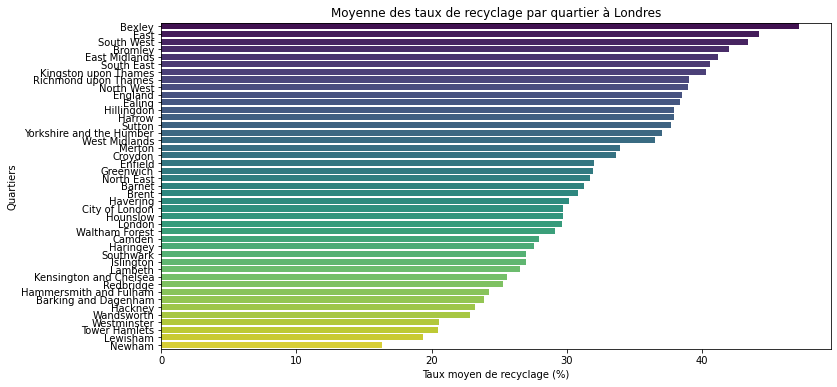

In [200]:
recycl = pd.read_csv("Household-rcycling-borough.csv")
# Moyenne des taux de recyclage par quartier
moyenne_recyclage = recycl.groupby("Area")["Recycling_Rates"].mean().reset_index()

# Afficher les 10 premières lignes
print(moyenne_recyclage.head())

# Trier les quartiers par taux de recyclage moyen (optionnel)
moyenne_recyclage = moyenne_recyclage.sort_values(by="Recycling_Rates", ascending=False)

# Visualisation sous forme de barres
plt.figure(figsize=(12, 6))
sns.barplot(data=moyenne_recyclage, x="Recycling_Rates", y="Area", palette="viridis")
plt.xlabel("Taux moyen de recyclage (%)")
plt.ylabel("Quartiers")
plt.title("Moyenne des taux de recyclage par quartier à Londres")
plt.show()


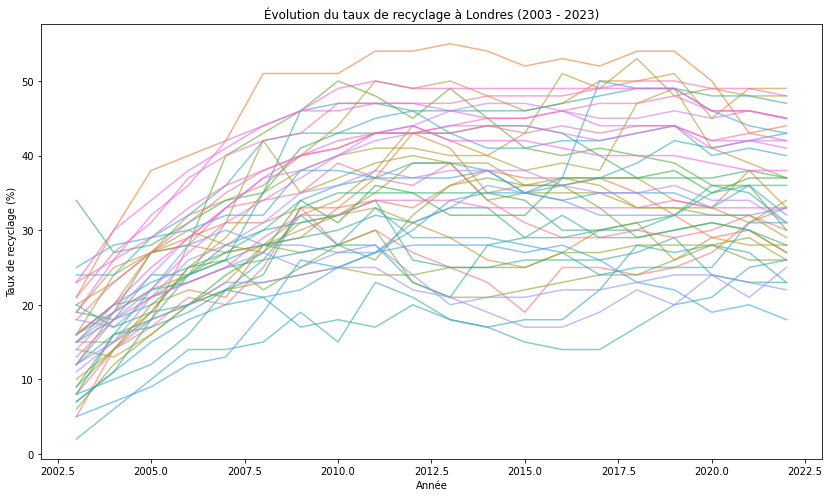

In [121]:
# Convertir l'année en format numérique pour l'affichage (prendre seulement la première partie "2003" de "2003/04")
recycl["Year"] = recycl["Year"].str[:4].astype(int)

# Tracer l'évolution pour chaque quartier
plt.figure(figsize=(14, 8))
sns.lineplot(data=recycl, x="Year", y="Recycling_Rates", hue="Area", legend=False, alpha=0.6)

plt.xlabel("Année")
plt.ylabel("Taux de recyclage (%)")
plt.title("Évolution du taux de recyclage à Londres (2003 - 2023)")
plt.show()

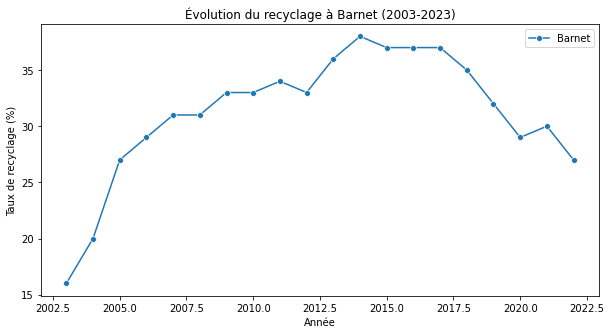

In [122]:
# Sélectionner un quartier spécifique
quartier = "Barnet"
df_quartier = recycl[recycl["Area"] == quartier]

# Tracer l'évolution pour ce quartier
plt.figure(figsize=(10, 5))
sns.lineplot(data=df_quartier, x="Year", y="Recycling_Rates", marker="o", label=quartier)

plt.xlabel("Année")
plt.ylabel("Taux de recyclage (%)")
plt.title(f"Évolution du recyclage à {quartier} (2003-2023)")
plt.legend()
plt.show()


In [124]:
#pip install folium geopandas plotly

In [7]:
london_boroughs_coords = {
    "City of London": [51.51279, -0.09184],
    "Barking and Dagenham": [51.5362, 0.1275],
    "Barnet": [51.6255, -0.1514],
    "Bexley": [51.455, 0.1502],
    "Brent": [51.5588, -0.2817],
    "Bromley": [51.4054, 0.0144],
    "Camden": [51.5416, -0.1431],
    "Croydon": [51.3751, -0.0982],
    "Ealing": [51.513, -0.3086],
    "Enfield": [51.6623, -0.118],
    "Greenwich": [51.4892, 0.0648],
    "Hackney": [51.553, -0.06],
    "Hammersmith and Fulham": [51.4927, -0.2213],
    "Haringey": [51.5908, -0.1097],
    "Harrow": [51.5788, -0.3337],
    "Havering": [51.5761, 0.1837],
    "Hillingdon": [51.5352, -0.4482],
    "Hounslow": [51.4746, -0.3702],
    "Islington": [51.5441, -0.1026],
    "Kensington and Chelsea": [51.4995, -0.1936],
    "Kingston upon Thames": [51.4123, -0.3007],
    "Lambeth": [51.488, -0.1154],
    "Lewisham": [51.4415, -0.0117],
    "Merton": [51.4098, -0.2102],
    "Newham": [51.5255, 0.0352],
    "Redbridge": [51.5886, 0.0822],
    "Richmond upon Thames": [51.4452, -0.3294],
    "Southwark": [51.4979, -0.0758],
    "Sutton": [51.359, -0.191],
    "Tower Hamlets": [51.5155, -0.0371],
    "Waltham Forest": [51.5884, -0.0112],
    "Wandsworth": [51.4576, -0.191],
    "Westminster": [51.4975, -0.1357],
}

In [202]:
# Calcul du taux moyen de recyclage par quartier
avg_recycling = recycl.groupby("Area")["Recycling_Rates"].mean().to_dict()

# Création de la carte centrée sur Londres
m = folium.Map(location=[51.5074, -0.1278], zoom_start=10)

# Fonction pour déterminer la couleur en fonction du taux de recyclage
def get_recycling_color(rate):
    if rate <= 10:
        return "red"  # Faible
    elif rate <= 20:
        return "orange"  # Moyenne
    elif rate <= 30:
        return "yellow"  # Élevée
    else:
        return "green"  # Très élevée

# Ajout de marqueurs pour chaque quartier
for borough, coords in london_boroughs_coords.items():
    if borough in avg_recycling:
        mean_rate = avg_recycling[borough]
        
        # Création du graphique d'évolution avec Plotly
        borough_data = recycl[recycl["Area"] == borough]
        fig = px.line(
            borough_data,
            x="Year",
            y="Recycling_Rates",
            title=f"Évolution du taux de recyclage à {borough}",
            labels={"Year": "Année", "Recycling_Rates": "Taux de recyclage (%)"},
        )

        # Conversion du graphique en HTML
        iframe = IFrame(fig.to_html(full_html=False, include_plotlyjs='cdn'), width=500, height=300)
        popup = Popup(iframe, max_width=500)

        # Ajout d'un cercle sur la carte avec la couleur selon le taux de recyclage
        folium.CircleMarker(
            location=coords,
            radius=10,
            color="blue",
            fill=True,
            fill_color=get_recycling_color(mean_rate),  # Couleur selon le taux
            fill_opacity=0.6,
            popup=popup,
        ).add_to(m)

from branca.element import Template, MacroElement

# Création du template HTML pour la légende
legend_html = '''
<div style="
    position: fixed;
    bottom: 50px;
    left: 50px;
    width: 180px;
    height: 150px;
    background-color: white;
    z-index:9999;
    font-size:14px;
    border-radius: 5px;
    padding: 10px;
    box-shadow: 2px 2px 5px rgba(0,0,0,0.3);
">
    <b>Légende du recyclage</b><br>
    <i class="fa fa-circle" style="color:red"></i> Faible (≤10%)<br>
    <i class="fa fa-circle" style="color:orange"></i> Moyenne (11-20%)<br>
    <i class="fa fa-circle" style="color:yellow"></i> Élevée (21-30%)<br>
    <i class="fa fa-circle" style="color:green"></i> Très élevée (>30%)<br>
</div>
'''

# Ajout du code à la carte Folium
legend = MacroElement()
legend._template = Template(legend_html)
m.get_root().add_child(legend)

# Sauvegarde et affichage de la carte
m.save("carte_recyclage.html")
m


In [199]:
from folium import Popup

In [41]:
prix_moyen

,Code,Area,Year ending Dec 1995,Year ending Mar 1996,Year ending Jun 1996,Year ending Sep 1996,Year ending Dec 1996,Year ending Mar 1997,Year ending Jun 1997,Year ending Sep 1997,...,Year ending Sep 2015,Year ending Dec 2015,Year ending Mar 2016,Year ending Jun 2016,Year ending Sep 2016,Year ending Dec 2016,Year ending Mar 2017,Year ending Jun 2017,Year ending Sep 2017,Year ending Dec 2017
0,E09000001,City of London,146 043,148 413,139 566,131 873,136 344,142 328,148 007,149 608,...,929 347,926 292,935 604,917 834,895 825,928 037,929 037,953 512,961 783,950 760
1,E09000002,Barking and Dagenham,50 615,50 589,50 972,51 680,51 680,52 225,53 081,54 582,...,234 226,244 126,254 179,265 260,275 923,289 176,299 383,301 708,302 686,301 518
2,E09000003,Barnet,111 019,111 312,110 356,110 408,111 203,114 975,120 432,128 540,...,553 003,566 874,576 762,582 039,581 036,584 202,590 823,616 325,638 641,667 593
3,E09000004,Bexley,66 294,66 237,66 892,67 535,69 941,71 221,72 937,74 479,...,285 822,295 262,306 399,319 770,331 444,340 626,345 354,347 505,352 460,357 779
4,E09000005,Brent,77 258,78 576,79 455,81 030,82 824,85 174,87 618,91 095,...,494 092,506 322,515 414,517 225,526 828,517 497,518 109,536 120,547 212,578 705
5,E09000006,Bromley,93 441,94 248,94 768,96 802,97 597,98 496,99 637,102 123,...,429 597,441 675,451 676,461 829,469 729,478 142,483 847,489 823,496 853,502 623
6,E09000007,Camden,151 364,150 180,155 522,164 692,168 988,176 378,181 088,182 975,...,1 041 169,1 040 035,1 085 177,1 088 629,1 045 917,1 063 248,1 029 438,1 082 928,1 121 810,1 099 876
7,E09000008,Croydon,71 800,72 145,73 119,74 630,75 678,77 097,78 531,81 044,...,328 459,340 768,350 929,357 942,366 448,372 054,377 366,385 383,395 862,399 645
8,E09000009,Ealing,91 045,90 306,90 963,93 989,97 595,99 959,103 396,108 733,...,509 376,524 967,539 608,542 632,546 006,553 669,552 560,568 092,577 818,578 110
9,E09000010,Enfield,78 510,77 819,79 326,80 649,82 956,85 450,89 034,92 547,...,378 790,389 903,404 433,419 358,438 829,450 294,459 261,464 622,461 150,463 806


# 2-Clustering

In [28]:
ventes=pd.read_csv("ventes.csv",sep=";")
prix_moyen=pd.read_csv("moyennes_prix.csv",sep=";")
prix_median=pd.read_csv("medianes_prix.csv",sep=";")
prix_quartile=pd.read_csv("quartiles_prix.csv",sep=";")

ventes = ventes.dropna(subset=['Code'])
prix_moyen = prix_moyen.dropna(subset=['Code'])
prix_median = prix_median.dropna(subset=['Code'])
prix_quartile = prix_quartile.dropna(subset=['Code'])

# Fusionner ventes avec prix_moyen
df1 = pd.merge(ventes, prix_moyen, on="Code", suffixes=('_ventes', '_moyen'))

# Fusionner avec prix_median
df2 = pd.merge(df1, prix_median, on="Code", suffixes=('', '_median'))

# Fusionner avec prix_quartile (si nécessaire, selon les colonnes que tu veux garder)
df3 = pd.merge(df2, prix_quartile, on="Code", suffixes=('', '_quartile'))

recyclage=pd.read_csv("Household-rcycling-borough.csv")
dispo=pd.read_csv("Dclg-affordable-housing-borough.csv")

def transform_year(year):
    # Si l'année suit le format "YYYY-YY" (comme "2003-04")
    if isinstance(year, str) and '-' in year:
        return int(year.split("-")[0])
    # Si l'année suit le format "YYYY/YY" (comme "2003/04")
    elif isinstance(year, str) and '/' in year:
        return int(year.split("/")[0])
    else:
        return year  # retourne la valeur d'origine en cas de format inconnu

# Transformation des années pour dispo uniquement
dispo['Year'] = dispo['Year'].apply(transform_year)

# Transformation des années pour recyclage
recyclage['Year'] = recyclage['Year'].apply(transform_year)

# Pivoté les données du recyclage pour que les années deviennent des colonnes
recyclage_pivot = recyclage.pivot_table(index=['Code', 'Area'], columns='Year', values='Recycling_Rates', aggfunc='mean')

# Supprimer les virgules dans 'Affordable Housing Supply'
dispo['Affordable Housing Supply'] = dispo['Affordable Housing Supply'].str.replace(',', '')

# Convertir la colonne en numérique
dispo['Affordable Housing Supply'] = pd.to_numeric(dispo['Affordable Housing Supply'], errors='coerce')
# Pivot des données : la colonne Year devient les colonnes et les valeurs sont dans 'Affordable Housing Supply'
dispo_pivoted = dispo.pivot_table(index=['Code', 'Area'], columns='Year', values='Affordable Housing Supply', aggfunc='mean')

# Fusionner avec df_combiné
df4 = pd.merge(df3,recyclage_pivot, on=['Code', 'Area'], how='left',suffixes=('','_recyclage'))
df5 = pd.merge(df4,dispo_pivoted, on=['Code', 'Area'], how='left',suffixes=('','_dispo'))


# Supprimer les lignes avec des NaN
df5 = df5.dropna()

# Associer les coordonnées aux boroughs de Londres
df5["Latitude"] = df5["Area"].map(lambda x: london_boroughs_coords.get(x, [None, None])[0])
df5["Longitude"] = df5["Area"].map(lambda x: london_boroughs_coords.get(x, [None, None])[1])

df5 = df5.dropna(subset=["Latitude", "Longitude"])

# Liste des colonnes à exclure (exemple : identifiants, noms, etc.)
colonnes_a_exclure = ["Code", "Area_ventes", "Latitude", "Longitude","Area_moyen","Area","Area_quartile"]  

# Sélectionner toutes les autres colonnes
features = df5.columns.difference(colonnes_a_exclure)  


# Créer le DataFrame pour le clustering
df_cluster = df5[features].dropna()
# Supprimer les espaces insécables et autres caractères non numériques pour toutes les colonnes
df_cluster = df_cluster.replace(r'\s+', '', regex=True)

# Convertir toutes les colonnes en numérique, en ignorant les erreurs (coercition en NaN si non convertible)
df_cluster = df_cluster.apply(pd.to_numeric, errors='coerce')

# Normalisation des données
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_cluster)

# Appliquer K-Means avec le bon nombre de clusters
kmeans = KMeans(n_clusters=4, random_state=42)  # Remplace 4 par le bon k trouvé
df_cluster['Cluster'] = kmeans.fit_predict(X_scaled)

# Ajouter les clusters au DataFrame principal
df5['Cluster'] = df_cluster['Cluster']

# Visualisation avec Plotly (Carte interactive)
fig = px.scatter_mapbox(df5, lat="Latitude", lon="Longitude", color="Cluster",
                        hover_name="Area", zoom=10, mapbox_style="carto-positron")
fig.show()

In [39]:
print(df5.columns)


Index([                       'Code',                 'Area_ventes',
       'Year ending Dec 1995_ventes', 'Year ending Mar 1996_ventes',
       'Year ending Jun 1996_ventes', 'Year ending Sep 1996_ventes',
       'Year ending Dec 1996_ventes', 'Year ending Mar 1997_ventes',
       'Year ending Jun 1997_ventes', 'Year ending Sep 1997_ventes',
       ...
                        '2017_dispo',                  '2018_dispo',
                        '2019_dispo',                  '2020_dispo',
                        '2021_dispo',                  '2022_dispo',
                                2023,                    'Latitude',
                         'Longitude',                     'Cluster'],
      dtype='object', length=417)


In [44]:
# Nettoyer les données : supprimer les espaces, les caractères non numériques et convertir en numérique
df5['Year ending Dec 2017_moyen'] = df5['Year ending Dec 2017_moyen'].replace({r'\s+': '', r'[^\d.]': ''}, regex=True)

# Convertir les valeurs en nombres (en forçant les erreurs à devenir NaN)
df5['Year ending Dec 2017_moyen'] = pd.to_numeric(df5['Year ending Dec 2017_moyen'], errors='coerce')

# Calculer la moyenne de la colonne 'Year ending Dec 2017_moyen' par cluster
prix_2017_moyenne = df5.groupby('Cluster')['Year ending Dec 2017_moyen'].mean()

# Afficher la moyenne par cluster
print("Moyenne des prix pour l'année 2017 par cluster:")
print(prix_2017_moyenne)


Moyenne des prix pour l'année 2017 par cluster:
Cluster
0    5.063395e+05
1    1.905304e+06
2    9.240402e+05
3    5.970760e+05
Name: Year ending Dec 2017_moyen, dtype: float64


In [22]:
for col in df_cluster.columns:
    if df_cluster[col].dtype == 'object':  # Vérifie si la colonne contient du texte
        print(f"Colonne problématique : {col}")
        print(df_cluster[col].unique())  # Affiche les valeurs uniques pour comprendre


In [33]:
# Appliquer K-Means avec le bon nombre de clusters
kmeans = KMeans(n_clusters=4, random_state=42)  # Remplace 4 par le bon k trouvé
df_cluster['Cluster'] = kmeans.fit_predict(X_scaled)

# Ajouter les clusters au DataFrame principal
df5['Cluster'] = df_cluster['Cluster']

# Visualisation avec Plotly (Carte interactive)
fig = px.scatter_mapbox(df5, lat="Latitude", lon="Longitude", color="Cluster",
                        hover_name="Area", zoom=10, mapbox_style="carto-positron")
fig.show()

<ipython-input-33-18422a59da28>:9: DeprecationWarning:

*scatter_mapbox* is deprecated! Use *scatter_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/



In [215]:
import folium
from folium.plugins import MarkerCluster

# Définition des couleurs pour chaque cluster (ajuster si plus de 10 clusters)
colors = ['red', 'blue', 'green', 'purple', 'orange', 'darkred', 'lightred', 'beige', 'darkblue', 'darkgreen']
df5['Color'] = df5['Cluster'].apply(lambda x: colors[x % len(colors)])

# Créer la carte centrée sur Londres
m = folium.Map(location=[51.5074, -0.1278], zoom_start=10)  # Coordonnées centrales de Londres

# Ajouter un regroupement des points
marker_cluster = MarkerCluster().add_to(m)

# Ajouter chaque quartier sur la carte
for _, row in df5.dropna(subset=["Latitude", "Longitude"]).iterrows():
    folium.CircleMarker(
        location=[row['Latitude'], row['Longitude']],
        radius=6,
        color=row['Color'],
        fill=True,
        fill_color=row['Color'],
        fill_opacity=0.7,
        popup=folium.Popup(
            f"<b>Quartier :</b> {row['Area']}<br>"
            f"<b>Cluster :</b> {row['Cluster']}<br>"
            f"<b>Prix moyen :</b> {row.get('Prix_moyen', 'N/A')}<br>"
            f"<b>Nombre de ventes :</b> {row.get('Ventes', 'N/A')}",
            max_width=300
        )
    ).add_to(marker_cluster)

# Afficher la carte
m


In [205]:
import numpy as np

# Vérifier s'il y a des NaN ou des valeurs infinies dans X_scaled
if np.isnan(X_scaled).sum() > 0 or np.isinf(X_scaled).sum() > 0:
    print("⚠️ Attention : Il y a des NaN ou des valeurs infinies dans X_scaled !")

# Remplacer les NaN par la moyenne de chaque colonne (ou une autre stratégie)
X_scaled = np.nan_to_num(X_scaled, nan=np.nanmean(X_scaled))

# Vérifier à nouveau après correction
print("Nombre de NaN après correction :", np.isnan(X_scaled).sum())
print("Nombre de valeurs infinies après correction :", np.isinf(X_scaled).sum())

# Appliquer le clustering avec KMeans
kmeans = KMeans(n_clusters=k_optimal, random_state=42, n_init=10)
df5["Cluster"] = kmeans.fit_predict(X_scaled)


⚠️ Attention : Il y a des NaN ou des valeurs infinies dans X_scaled !
Nombre de NaN après correction : 0
Nombre de valeurs infinies après correction : 0


In [106]:
# Sélectionner uniquement les colonnes numériques pour le clustering
cols_numeriques = df_copy1.select_dtypes(include=[np.number]).columns
X = df_copy1[cols_numeriques]

# Normalisation des données
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

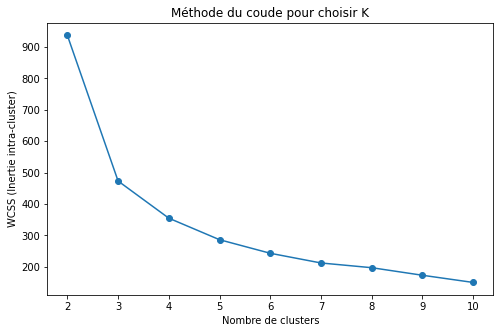

In [107]:
# 🟠 2. Choix du nombre de clusters avec la méthode du coude
wcss = []
for k in range(2, 11):  # Tester de 2 à 10 clusters
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(8, 5))
plt.plot(range(2, 11), wcss, marker='o')
plt.xlabel('Nombre de clusters')
plt.ylabel('WCSS (Inertie intra-cluster)')
plt.title("Méthode du coude pour choisir K")
plt.show()

In [109]:
# 🟡 3. Appliquer le clustering avec le K optimal (ex: 4)
k_optimal = 3
kmeans = KMeans(n_clusters=k_optimal, random_state=42, n_init=10)
df_copy1["Cluster"] = kmeans.fit_predict(X_scaled)

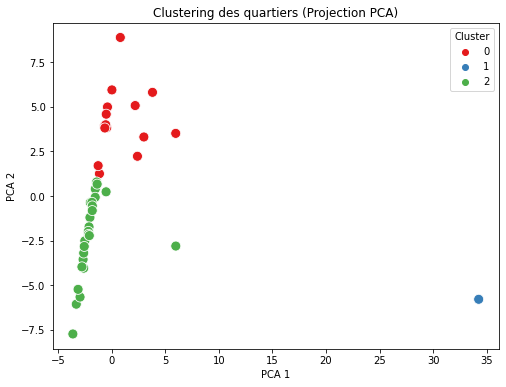

Silhouette Score : 0.39


In [110]:
# 🟣 4. Réduction dimensionnelle pour visualisation
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(8, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=df["Cluster"], palette="Set1", s=100)
plt.xlabel("PCA 1")
plt.ylabel("PCA 2")
plt.title("Clustering des quartiers (Projection PCA)")
plt.legend(title="Cluster")
plt.show()

# 🟢 5. Évaluation avec silhouette score
silhouette_avg = silhouette_score(X_scaled, df["Cluster"])
print(f"Silhouette Score : {silhouette_avg:.2f}")

In [97]:
df=df5.copy()

In [105]:
df.dropna(inplace=True) 

In [203]:
import folium
import matplotlib.colors as mcolors
import pandas as pd

# Convertir les coordonnées des quartiers en DataFrame
coords_df = pd.DataFrame.from_dict(london_boroughs_coords, orient="index", columns=["Latitude", "Longitude"]).reset_index()
coords_df.rename(columns={"index": "Area"}, inplace=True)

# Fusionner avec le DataFrame df5
df5 = df5.merge(coords_df, on="Area", how="left")

# Définir des couleurs pour chaque cluster
num_clusters = df5["Cluster"].nunique()
colors = list(mcolors.TABLEAU_COLORS.values())[:num_clusters]  # Prendre des couleurs distinctes

# Créer une carte centrée sur Londres
m = folium.Map(location=[51.5074, -0.1278], zoom_start=10)

# Ajouter les points des quartiers avec une couleur selon leur cluster
for _, row in df5.iterrows():
    folium.CircleMarker(
        location=[row["Latitude"], row["Longitude"]],
        radius=8,
        color=colors[row["Cluster"]],
        fill=True,
        fill_color=colors[row["Cluster"]],
        fill_opacity=0.6,
        popup=f"{row['Area']} - Cluster {row['Cluster']}"
    ).add_to(m)

# Afficher la carte
#m.save("clusters_londres.html")
m

KeyError: 'Cluster'

# 3 Regression pour expliquer le prix 

Nous avons à disposition le tableau de données london_houses.csv. Les variables sont : 
-l'adresse
-le quartier
-le nombre de salles de bain
-le nombre de chambres
-la surface
-l'âge du batiment/de la structure
-présence de garafe 
-présence de jardin 
-nombre d'étages
-Type d'énergie 
-présence/type de balcon
-style de l'intérieur 
-la vue 
-les matériaux 
-le statut de rénovation
-le prix 
Nous disposons de 1000 foyers différents. La variable à expliquer est le prix et les variables explicatives sont les variables restantes. 


In [129]:
prix = pd.read_csv("london_houses.csv")

In [130]:
prix

,Address,Neighborhood,Bedrooms,Bathrooms,Square Meters,Building Age,Garden,Garage,Floors,Property Type,Heating Type,Balcony,Interior Style,View,Materials,Building Status,Price (£)
0,78 Regent Street,Notting Hill,2,3,179,72,No,No,3,Semi-Detached,Electric Heating,High-level Balcony,Industrial,Garden,Marble,Renovated,2291200
1,198 Oxford Street,Westminster,2,1,123,34,Yes,No,1,Apartment,Central Heating,High-level Balcony,Industrial,City,Laminate Flooring,Old,1476000
2,18 Regent Street,Soho,5,3,168,38,No,Yes,3,Semi-Detached,Central Heating,No Balcony,Industrial,Street,Wood,Renovated,1881600
3,39 Piccadilly Circus,Islington,5,1,237,53,Yes,Yes,1,Apartment,Underfloor Heating,No Balcony,Classic,Park,Granite,Renovated,1896000
4,116 Fleet Street,Marylebone,4,1,127,23,No,Yes,2,Semi-Detached,Central Heating,No Balcony,Modern,Park,Wood,Old,1524000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,44 Camden High Street,Westminster,1,3,81,4,Yes,Yes,2,Semi-Detached,Central Heating,Low-level Balcony,Modern,Street,Laminate Flooring,Renovated,1166400
996,165 Park Lane,Camden,1,1,65,51,No,No,1,Apartment,Underfloor Heating,No Balcony,Industrial,Garden,Wood,Old,563333
997,99 Camden High Street,Camden,4,1,191,27,No,Yes,2,Semi-Detached,Central Heating,Low-level Balcony,Minimalist,Park,Laminate Flooring,Old,1986399
998,155 Park Lane,Camden,5,2,131,3,Yes,No,2,Detached House,Underfloor Heating,High-level Balcony,Modern,Park,Laminate Flooring,Renovated,1703000


## 3.1 Découpage apprentissage/test

In [132]:
from sklearn.model_selection import train_test_split
import pandas as pd

# Charger les données
prix = pd.read_csv("london_houses.csv")

# Définir les 5 catégories de prix basées sur les quantiles (qcut)
prix['Price Category'] = pd.qcut(prix['Price (£)'], q=5, labels=['Très Bas', 'Bas', 'Moyen', 'Haut', 'Très Haut'])

# Afficher la répartition des catégories
print(prix['Price Category'].value_counts())

# Séparer les features (X) et la cible (y)
X = prix.drop(columns=['Price (£)', 'Address', 'Price Category'])  # On enlève "Price", "Address" et la cible
y = prix['Price Category']  # Cible (catégorie de prix)

# Découper en train (80%) et test (20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Vérifier la taille des ensembles
print(f"Taille du jeu d'entraînement : {X_train.shape}")
print(f"Taille du jeu de test : {X_test.shape}")


Très Bas     201
Bas          201
Haut         200
Très Haut    200
Moyen        198
Name: Price Category, dtype: int64
Taille du jeu d'entraînement : (800, 15)
Taille du jeu de test : (200, 15)


## 3.2 Régression simple 

In [139]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import pandas as pd
import numpy as np

# Charger les données
prix = pd.read_csv("london_houses.csv")

# Sélectionner les variables explicatives et la cible
X = prix.drop(columns=['Price (£)', 'Address'])  # On enlève aussi l'adresse
y = prix['Price (£)']  # Variable cible

# Vérification et conversion de la variable cible
prix['Price (£)'] = pd.to_numeric(prix['Price (£)'], errors='coerce')

# Sélectionner les variables explicatives et la cible
X = prix.drop(columns=['Price (£)', 'Address'])
y = prix['Price (£)']

# Encoder les variables catégorielles (Label Encoding pour les tests)
for col in X.select_dtypes(include=['object']).columns:
    X[col] = LabelEncoder().fit_transform(X[col])

# Séparer les données en train (80%) et test (20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Entraînement du modèle
model = LinearRegression()
model.fit(X_train, y_train)

# Prédiction
y_pred = model.predict(X_test)

# Convertir y_test et y_pred en float si nécessaire
y_test = y_test.astype(float)
y_pred = y_pred.astype(float)

# Définir une tolérance (par exemple, 10% du prix réel)
tolerance = 0.10  # 10%

# Calcul de l'erreur absolue
error = np.abs(y_test - y_pred)

# Calcul de l'erreur tolérée (valeur réelle * tolérance)
tolerated_error = y_test * tolerance

# Vérification des prédictions dans la plage tolérée
correct_predictions = error <= tolerated_error
accuracy_with_tolerance = np.mean(correct_predictions) * 100

# Évaluation
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"RMSE : {rmse:.2f}")
print(f"MAE : {mae:.2f}")
print(f"R² : {r2:.4f}")
print(f"Prédictions correctes avec tolérance de {tolerance*100}% : {accuracy_with_tolerance:.2f}%")


RMSE : 529509.95
MAE : 408583.68
R² : 0.6519
Prédictions correctes avec tolérance de 10.0% : 21.50%


### normaliser !!!!

## 3.3 Forêt aléatoire

In [140]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
import numpy as np

# Création du modèle de forêt aléatoire
rf = RandomForestRegressor(n_estimators=100, random_state=42)

# Entraînement du modèle
rf.fit(X_train, y_train)

# Prédiction sur les données de test
y_pred_rf = rf.predict(X_test)

# Calcul des métriques
mae_rf = mean_absolute_error(y_test, y_pred_rf)
rmse_rf = np.sqrt(mean_squared_error(y_test, y_pred_rf))
r2_rf = r2_score(y_test, y_pred_rf)

# Calcul du taux de prédiction correcte avec tolérance de 10%
tolerance = 0.10
correct_predictions_rf = np.mean(np.abs(y_test - y_pred_rf) / y_test <= tolerance) * 100

# Affichage des résultats
print(f"RMSE : {rmse_rf:.2f}")
print(f"MAE : {mae_rf:.2f}")
print(f"R² : {r2_rf:.4f}")
print(f"Prédictions correctes avec tolérance de {tolerance*100}% : {correct_predictions_rf:.2f}%")


RMSE : 291601.26
MAE : 227098.95
R² : 0.8944
Prédictions correctes avec tolérance de 10.0% : 47.00%


## 3.4 Gradient Boosting 

In [141]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

# Entraînement du modèle GradientBoosting
gb = GradientBoostingRegressor(n_estimators=100, random_state=42)
gb.fit(X_train, y_train)

# Prédiction
y_pred_gb = gb.predict(X_test)

# Calcul des métriques
rmse_gb = mean_squared_error(y_test, y_pred_gb, squared=False)
mae_gb = mean_absolute_error(y_test, y_pred_gb)
r2_gb = r2_score(y_test, y_pred_gb)

# Calcul de la précision avec une tolérance de 10%
tolerance = 0.10
correct_predictions_gb = (np.abs((y_test - y_pred_gb) / y_test) <= tolerance).mean() * 100

# Affichage des résultats
print(f"RMSE : {rmse_gb:.2f}")
print(f"MAE : {mae_gb:.2f}")
print(f"R² : {r2_gb:.4f}")
print(f"Prédictions correctes avec tolérance de 10.0% : {correct_predictions_gb:.2f}%")


RMSE : 147167.53
MAE : 94136.54
R² : 0.9731
Prédictions correctes avec tolérance de 10.0% : 87.00%


# 4 Classification
## 4.1 Création de clusters 
Nous avons décidé de créer 5 catégories de prix afin de faire de la classification. Pour ce faire nous avons dans un premier temps créer un jeu de données d'apprentissage et un jeu de données test (80/20). ?? faire plsrs Découpages ??
Quintiles ou choix de valeurs pertinentes ??? selon ce que l'on veut quantifier. Préciser comment ont été choisies les 5 classes de prix. 
Dans le cas des quintiles forcément chaque classe est uniforme. 
Cette classification peut permettre à un vendeur de savoir à quel prix vendre sa maison. Bien que 5 classes se soit encore assez large

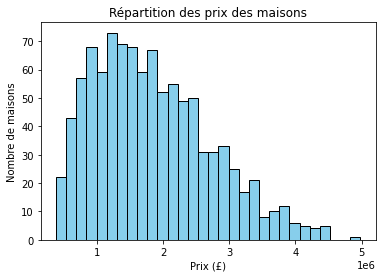

Price Cluster
0    8.386306e+05
1    2.213869e+06
2    3.007428e+06
3    1.502790e+06
4    3.938612e+06
Name: Price (£), dtype: float64


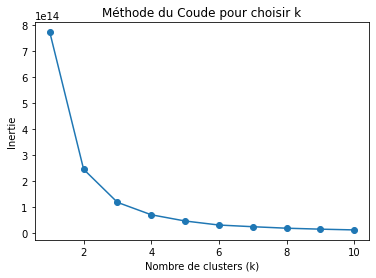

In [142]:
from sklearn.cluster import KMeans
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Charger les données
prix = pd.read_csv("london_houses.csv")

# On sélectionne uniquement la variable "Price (£)" pour le clustering
prix_data = prix[['Price (£)']]

# Appliquer le clustering K-Means
kmeans = KMeans(n_clusters=5, random_state=42)  # Ici on choisit k=5 mais tu peux ajuster
prix['Price Cluster'] = kmeans.fit_predict(prix_data)

# Visualisation de l'histogramme des clusters (tu peux ajuster les bins)
plt.hist(prix['Price (£)'], bins=30, color='skyblue', edgecolor='black')
plt.title("Répartition des prix des maisons")
plt.xlabel("Prix (£)")
plt.ylabel("Nombre de maisons")
plt.show()

# Affichage des prix moyens par cluster
prix_grouped = prix.groupby('Price Cluster')['Price (£)'].mean()
print(prix_grouped)

# Si tu veux tester la méthode du coude pour choisir k
# On va essayer différentes valeurs de k et calculer la somme des distances intra-clusters
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(prix_data)
    inertia.append(kmeans.inertia_)

# Tracer la courbe de la méthode du coude
plt.plot(range(1, 11), inertia, marker='o')
plt.title("Méthode du Coude pour choisir k")
plt.xlabel("Nombre de clusters (k)")
plt.ylabel("Inertie")
plt.show()


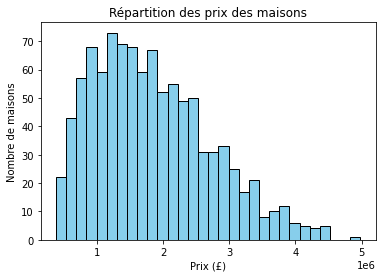

Price Cluster
0    8.386306e+05
1    2.213869e+06
2    3.007428e+06
3    1.502790e+06
4    3.938612e+06
Name: Price (£), dtype: float64


In [143]:
from sklearn.cluster import KMeans
import pandas as pd
import matplotlib.pyplot as plt

# Charger les données
prix = pd.read_csv("london_houses.csv")

# On sélectionne uniquement la variable "Price (£)" pour le clustering
prix_data = prix[['Price (£)']]

# Appliquer le clustering K-Means avec 5 clusters
kmeans = KMeans(n_clusters=5, random_state=42)
prix['Price Cluster'] = kmeans.fit_predict(prix_data)

# Visualisation des prix par cluster
plt.hist(prix['Price (£)'], bins=30, color='skyblue', edgecolor='black')
plt.title("Répartition des prix des maisons")
plt.xlabel("Prix (£)")
plt.ylabel("Nombre de maisons")
plt.show()

# Moyennes des prix par cluster
prix_grouped = prix.groupby('Price Cluster')['Price (£)'].mean()
print(prix_grouped)


## 4.2 Random Forest 

In [148]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.preprocessing import LabelEncoder


from sklearn.preprocessing import LabelEncoder

# Initialisation du LabelEncoder
label_encoder = LabelEncoder()

# Liste des colonnes catégorielles (adapte selon ton dataset)
categorical_columns = ['Neighborhood', 'Garden', 'Garage', 'Property Type', 'Heating Type', 'Balcony', 'Interior Style', 'View', 'Materials', 'Building Status']

# Appliquer l'encodage sur chaque colonne catégorielle
for col in categorical_columns:
    prix[col] = label_encoder.fit_transform(prix[col]) 
    
# Sélection des variables explicatives (features)
X = prix.drop(columns=['Price (£)', 'Address', 'Price Cluster'])

# Variable cible : les clusters générés par k-means
y = prix['Price Cluster']

# Diviser en train et test (80% pour l'entraînement, 20% pour le test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Initialisation du modèle RandomForestClassifier
clf = RandomForestClassifier(random_state=42)

# Entraînement du modèle
clf.fit(X_train, y_train)

# Prédictions sur les données de test
y_pred = clf.predict(X_test)

# Évaluation du modèle
accuracy = accuracy_score(y_test, y_pred)
conf_matrix = confusion_matrix(y_test, y_pred)
class_report = classification_report(y_test, y_pred)

# Affichage des résultats
print(f"Accuracy : {accuracy:.4f}")
print("Matrice de confusion :\n", conf_matrix)
print("Rapport de classification :\n", class_report)


Accuracy : 0.6700
Matrice de confusion :
 [[44  0  0  7  0]
 [ 0 42  3 10  0]
 [ 0 12 12  1  0]
 [12 10  0 36  0]
 [ 0  4  7  0  0]]
Rapport de classification :
               precision    recall  f1-score   support

           0       0.79      0.86      0.82        51
           1       0.62      0.76      0.68        55
           2       0.55      0.48      0.51        25
           3       0.67      0.62      0.64        58
           4       0.00      0.00      0.00        11

    accuracy                           0.67       200
   macro avg       0.52      0.55      0.53       200
weighted avg       0.63      0.67      0.65       200



/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/opt/anaconda3/lib/python3.8/site-packages/sklearn/metrics/_classification.py:1245: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [150]:
# Afficher la composition des classes
prix['Price Cluster'].value_counts()

3    308
0    253
1    251
2    140
4     48
Name: Price Cluster, dtype: int64

## 4.3 XGBoost

In [152]:
#pip install xgboost lightgbm

In [155]:
import xgboost as xgb
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Créer un modèle XGBoost
model_lgb = lgb.LGBMClassifier(
    n_estimators=100, 
    learning_rate=0.1, 
    max_depth=7,  # Augmenter légèrement la profondeur pour permettre plus de splits
    min_data_in_leaf=5,  # Réduire ce seuil pour permettre plus de divisions
    min_gain_to_split=0.0  # Désactiver la contrainte de gain minimal
)

# Entraînement du modèle
model_xgb.fit(X_train, y_train)

# Prédictions sur les données de test
y_pred_xgb = model_xgb.predict(X_test)

# Évaluation
accuracy = accuracy_score(y_test, y_pred_xgb)
print(f"Accuracy : {accuracy:.4f}")
print("Matrice de confusion :")
print(confusion_matrix(y_test, y_pred_xgb))
print("Rapport de classification :")
print(classification_report(y_test, y_pred_xgb))


Accuracy : 0.7450
Matrice de confusion :
[[45  0  0  6  0]
 [ 0 39  6 10  0]
 [ 0  3 21  0  1]
 [ 7 11  0 40  0]
 [ 0  1  6  0  4]]
Rapport de classification :
              precision    recall  f1-score   support

           0       0.87      0.88      0.87        51
           1       0.72      0.71      0.72        55
           2       0.64      0.84      0.72        25
           3       0.71      0.69      0.70        58
           4       0.80      0.36      0.50        11

    accuracy                           0.74       200
   macro avg       0.75      0.70      0.70       200
weighted avg       0.75      0.74      0.74       200



In [154]:
import lightgbm as lgb
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# Créer un modèle LightGBM
model_lgb = lgb.LGBMClassifier(n_estimators=100, learning_rate=0.1, max_depth=5, num_class=5)

# Entraînement du modèle
model_lgb.fit(X_train, y_train)

# Prédictions sur les données de test
y_pred_lgb = model_lgb.predict(X_test)

# Évaluation
accuracy = accuracy_score(y_test, y_pred_lgb)
print(f"Accuracy : {accuracy:.4f}")
print("Matrice de confusion :")
print(confusion_matrix(y_test, y_pred_lgb))
print("Rapport de classification :")
print(classification_report(y_test, y_pred_lgb))


/opt/anaconda3/lib/python3.8/site-packages/dask/dataframe/utils.py:369: FutureWarning:

pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/opt/anaconda3/lib/python3.8/site-packages/dask/dataframe/utils.py:369: FutureWarning:

pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.

/opt/anaconda3/lib/python3.8/site-packages/dask/dataframe/utils.py:369: FutureWarning:

pandas.UInt64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.



[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000269 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 310
[LightGBM] [Info] Number of data points in the train set: 800, number of used features: 15
[LightGBM] [Info] Start training from score -1.376344
[LightGBM] [Info] Start training from score -1.406497
[LightGBM] [Info] Start training from score -1.939680
[LightGBM] [Info] Start training from score -1.163151
[LightGBM] [Info] Start training from score -3.073694
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best 

## 3.2 Arbre de décision 

La première méthode de classification que nous avons appliqué est la méthode des arbres de décision. 
On créé l'arbre et on entraine les données puis on essaie sur le test. On obtient une précision de 6O% ce qui n'est pas mauvais mais pas dingue non plus. Nous allons essayer avec d'autres méthodes d'améliorer cette précision.  

In [133]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import pandas as pd

# Charger les données
prix = pd.read_csv("london_houses.csv")

# Transformer la variable cible en catégories
prix['Price Category'] = pd.qcut(prix['Price (£)'], q=5, labels=['Très Bas', 'Bas', 'Moyen', 'Haut', 'Très Haut'])

# Supprimer la colonne "Price (£)" et "Address"
X = prix.drop(columns=['Price (£)', 'Address', 'Price Category'])  
y = prix['Price Category']  # Nouvelle cible catégorielle

# Encoder les variables catégorielles (Label Encoding pour les tests)
for col in X.select_dtypes(include=['object']).columns:
    X[col] = LabelEncoder().fit_transform(X[col])

# Découper en train (80%) et test (20%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Vérifier que tout est bien numérique
print(X_train.dtypes)

# Entraînement du modèle DecisionTreeClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score

tree = DecisionTreeClassifier(max_depth=5, random_state=42)
tree.fit(X_train, y_train)

# Prédiction
y_pred = tree.predict(X_test)

# Évaluation
print(f"Accuracy : {accuracy_score(y_test, y_pred):.4f}")


Neighborhood       int64
Bedrooms           int64
Bathrooms          int64
Square Meters      int64
Building Age       int64
Garden             int64
Garage             int64
Floors             int64
Property Type      int64
Heating Type       int64
Balcony            int64
Interior Style     int64
View               int64
Materials          int64
Building Status    int64
dtype: object
Accuracy : 0.6000


## 3.3 Foret aléatoire 
On essaie maintenant avec la méthode de forêt aléatoire. 

In [134]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Entraînement du modèle Random Forest
rf = RandomForestClassifier(n_estimators=1000, max_depth=10, random_state=42)
rf.fit(X_train, y_train)

# Prédiction
y_pred_rf = rf.predict(X_test)

# Évaluation
print(f"Accuracy (Random Forest) : {accuracy_score(y_test, y_pred_rf):.4f}")


Accuracy (Random Forest) : 0.5600


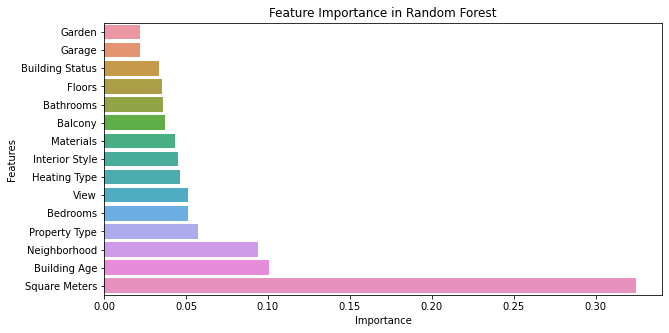

In [135]:
import matplotlib.pyplot as plt
import seaborn as sns

# Récupérer l'importance des features
feature_importances = rf.feature_importances_
feature_names = X_train.columns

# Trier les features par importance
sorted_idx = feature_importances.argsort()

# Graphique
plt.figure(figsize=(10, 5))
sns.barplot(x=feature_importances[sorted_idx], y=feature_names[sorted_idx])
plt.xlabel("Importance")
plt.ylabel("Features")
plt.title("Feature Importance in Random Forest")
plt.show()

## 3.4 XGBoost

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import mean_squared_error, r2_score

# Supposons que tu as déjà chargé ton DataFrame "prix"
# Exemple de données (tu devrais utiliser ton propre DataFrame ici)
# prix = pd.read_csv('ton_fichier.csv')  # Si tu charges les données depuis un fichier

# Encoder les variables catégorielles (en utilisant LabelEncoder)
label_encoder = LabelEncoder()

# Liste des colonnes catégorielles
categorical_columns = ['Neighborhood', 'Garden', 'Garage', 'Property Type', 'Heating Type', 'Balcony', 'Interior Style', 'View', 'Materials', 'Building Status']

# Appliquer l'encodage sur chaque colonne catégorielle
for col in categorical_columns:
    prix[col] = label_encoder.fit_transform(prix[col])

# Définir les variables indépendantes (X) et dépendantes (y)
X = prix.drop(['Price (£)', 'Address'], axis=1)  # Enlever 'Price' et 'Address' de X
y = prix['Price (£)']  # Prix en tant que variable dépendante

# Séparer les données en ensembles d'entraînement et de test
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Créer le modèle de régression linéaire
model = LinearRegression()

# Entraîner le modèle
model.fit(X_train, y_train)

# Prédire les prix sur l'ensemble de test
y_pred = model.predict(X_test)

# Évaluer le modèle
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Affichage des résultats
print(f'Mean Squared Error (MSE): {mse}')
print(f'R-squared (R²): {r2}')

# Affichage des coefficients du modèle
coefficients = pd.DataFrame(model.coef_, X.columns, columns=['Coefficient'])
print("Coefficients du modèle:")
print(coefficients)


## 2.1 london_house.csv
### 2.1.1 K-means

In [127]:
age_batiment.head(5)

,Address,Neighborhood,Bedrooms,Bathrooms,Square Meters,Building Age,Garden,Garage,Floors,Property Type,Heating Type,Balcony,Interior Style,View,Materials,Building Status,Price (£)
0,78 Regent Street,Notting Hill,2,3,179,72,No,No,3,Semi-Detached,Electric Heating,High-level Balcony,Industrial,Garden,Marble,Renovated,2291200
1,198 Oxford Street,Westminster,2,1,123,34,Yes,No,1,Apartment,Central Heating,High-level Balcony,Industrial,City,Laminate Flooring,Old,1476000
2,18 Regent Street,Soho,5,3,168,38,No,Yes,3,Semi-Detached,Central Heating,No Balcony,Industrial,Street,Wood,Renovated,1881600
3,39 Piccadilly Circus,Islington,5,1,237,53,Yes,Yes,1,Apartment,Underfloor Heating,No Balcony,Classic,Park,Granite,Renovated,1896000
4,116 Fleet Street,Marylebone,4,1,127,23,No,Yes,2,Semi-Detached,Central Heating,No Balcony,Modern,Park,Wood,Old,1524000


In [128]:
age_batiment["Building Status"].unique()

array(['Renovated', 'Old', 'New'], dtype=object)

In [129]:
features = ['Bedrooms', 'Bathrooms', 'Square Meters',
       'Building Age', 'Garden', 'Garage', 'Floors', 'Property Type',
       'Heating Type', 'Balcony', 'Interior Style', 'View', 'Materials',
       'Building Status', 'Price (£)']
df_filtered = age_batiment[features].dropna()  # Supprimer les lignes avec valeurs manquantes

pas de données manquantes

In [130]:
age_batiment['Garage'] = age_batiment['Garage'].map({'Yes': 1, 'No': 0})
age_batiment['Garden'] = age_batiment['Garden'].map({'Yes': 1, 'No': 0})

In [131]:
age_batiment = pd.get_dummies(age_batiment, columns=['Heating Type', 'Interior Style', 'Materials','Property Type', 'Neighborhood','Balcony'], drop_first=True)

In [ ]:
status_mapping_view = {
    "Old": 0,
    "Renovated": 1,
    "New": 2
}
age_batiment['Building Status'] = age_batiment['Building Status'].map(status_mapping_view)

In [132]:
status_mapping_building_status = {
    "Old": 0,
    "Renovated": 1,
    "New": 2
}
age_batiment['Building Status'] = age_batiment['Building Status'].map(status_mapping_building_status)

In [133]:
age_batiment

,Address,Bedrooms,Bathrooms,Square Meters,Building Age,Garden,Garage,Floors,View,Building Status,...,Neighborhood_Greenwich,Neighborhood_Islington,Neighborhood_Kensington,Neighborhood_Marylebone,Neighborhood_Notting Hill,Neighborhood_Shoreditch,Neighborhood_Soho,Neighborhood_Westminster,Balcony_Low-level Balcony,Balcony_No Balcony
0,78 Regent Street,2,3,179,72,0,0,3,Garden,1,...,0,0,0,0,1,0,0,0,0,0
1,198 Oxford Street,2,1,123,34,1,0,1,City,0,...,0,0,0,0,0,0,0,1,0,0
2,18 Regent Street,5,3,168,38,0,1,3,Street,1,...,0,0,0,0,0,0,1,0,0,1
3,39 Piccadilly Circus,5,1,237,53,1,1,1,Park,1,...,0,1,0,0,0,0,0,0,0,1
4,116 Fleet Street,4,1,127,23,0,1,2,Park,0,...,0,0,0,1,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,44 Camden High Street,1,3,81,4,1,1,2,Street,1,...,0,0,0,0,0,0,0,1,1,0
996,165 Park Lane,1,1,65,51,0,0,1,Garden,0,...,0,0,0,0,0,0,0,0,0,1
997,99 Camden High Street,4,1,191,27,0,1,2,Park,0,...,0,0,0,0,0,0,0,0,1,0
998,155 Park Lane,5,2,131,3,1,0,2,Park,1,...,0,0,0,0,0,0,0,0,0,0


In [98]:
scaler = StandardScaler()
df_scaled = scaler.fit_transform(age_batiment)

ValueError: could not convert string to float: '78 Regent Street'